In [1]:
# standard libraries
import pandas as pd
import numpy as np
import os
#from IPython.display import Image
#from IPython.display import clear_output
import time
import requests
import json
#import re

# visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from tabulate import tabulate
from datetime import timedelta
#import altair as alt
#alt.data_transformers.disable_max_rows()

In [2]:
#from community import community_louvain
from networkx.algorithms.community import greedy_modularity_communities
import community
import matplotlib.cm as cm
import matplotlib.pyplot as plt

In [3]:
from os import listdir
from os.path import isfile, join

class FilePathManager:
    def __init__(self, local_dir: str):
        self.local_dir = local_dir
    
    def retrieve_full_path(self):
        print(self.local_dir)
        return os.getcwd()+'/EDA/'+self.local_dir

In [7]:
from os import listdir
from os.path import isfile, join

class FilePathManager:
    def __init__(self, local_dir: str):
        self.local_dir = local_dir
    
    def retrieve_full_path(self):
        return os.getcwd()+'\\'+self.local_dir

In [4]:
class Loader:
    df = pd.DataFrame()
    
    def load_data(self, file_name):
        pass
    
    def get_df(self):
        pass
    
    def size(self):
        return len(self.df)

In [5]:
from typing import Callable
 
class CSVLoader(Loader):
    def __init__(self, file_path_manager: FilePathManager):
        self.file_path_manager = file_path_manager
        
    def load_data(self, _prepare_data: Callable[[pd.DataFrame], pd.DataFrame] = None):
        self.df = pd.read_csv(self.file_path_manager.retrieve_full_path(), low_memory=False)
        if _prepare_data:
            self.df = _prepare_data(self.df)
    
    def get_df(self):
        return self.df;
    
    def size(self):
        return len(self.df)  

In [6]:
def clean_data(df):
    df['Datetime_updated'] = pd.to_datetime(df['Datetime_updated'], infer_datetime_format=True)
    df['Datetime_updated_seconds'] = pd.to_datetime(df['Datetime_updated_seconds'], infer_datetime_format=True)
    return df

In [7]:
loader = CSVLoader(FilePathManager('Data_API.csv'))
loader.load_data(clean_data)
df = loader.get_df()

Data_API.csv


In [8]:
gb = df.groupby('Collection')    

In [13]:
print( "total # of unique collections in dataset:", len(gb.groups.keys()) )

total # of unique collections in dataset: 6283


In [9]:
# get target variable labels
f = open('EDA/atomichub.config')
data = json.load(f)
blist = data.get('data').get('global').get('col.blist')
wlist = data.get('data').get('global').get('col.wlist')

In [10]:
print("# blacklisted collections on AtomicHub:", len(blist))
print("# whitelisted collections on AtomicHub:", len(wlist))

# blacklisted collections on AtomicHub: 5941
# whitelisted collections on AtomicHub: 2352


In [11]:
# match target variable labels with collection names in dataset
blacklist = []
whitelist = []
neither = []
for c in gb.groups.keys():
    blacklisted = True if c in blist else False
    whitelisted = True if c in wlist else False
    if blacklisted:
        blacklist.append(1)
    else:
        blacklist.append(0)
    if whitelisted:
        whitelist.append(1)
    else:
        whitelist.append(0)
    if not blacklisted and not whitelisted:
        neither.append(1)
    else:
        neither.append(0)

In [12]:
coll_labels = pd.DataFrame({'collection':gb.groups.keys(),'blacklist':blacklist, 'whitelist':whitelist, 'neither':neither})
coll_labels

,collection,blacklist,whitelist,neither
0,0-domains,0,0,1
1,0x-meets-imtoken,0,0,1
2,0x001ba7dc2ddfa893c17b6b478c9853b83fc8594c,0,0,1
3,0xbitcoinmemes,0,0,1
4,0xearth,0,0,1
...,...,...,...,...
6278,zodiacstars1,0,0,1
6279,zombaeseries,0,1,0
6280,zombieartist,0,1,0
6281,zombiesperks,0,0,1


In [13]:
print('blacklisted collections in dataset:', sum(coll_labels['blacklist']), ",", 
      round(sum(coll_labels['blacklist'])/coll_labels.shape[0]*100,1),'%')
print('\nwhitelisted collections in dataset:', sum(coll_labels['whitelist']), ",",
      round(sum(coll_labels['whitelist'])/coll_labels.shape[0]*100,1),'%')
print('\ncollections not white or black listed in dataset:', sum(coll_labels['neither']), ",", 
      round(sum(coll_labels['neither'])/coll_labels.shape[0]*100,1),'%')

blacklisted collections in dataset: 275 , 4.4 %

whitelisted collections in dataset: 720 , 11.5 %

collections not white or black listed in dataset: 5288 , 84.2 %


In [14]:
# Collections for model training 
coll_train = coll_labels[coll_labels['neither']==0]
coll_train

,collection,blacklist,whitelist,neither
31,12345rainbow,1,0,0
40,1amazingbook,0,1,0
43,1bitcoinlive,0,1,0
46,1bodyinmove1,0,1,0
50,1coolartnft1,0,1,0
...,...,...,...,...
6272,zeugencorona,1,0,0
6274,zippergirls1,0,1,0
6275,zlfhomedecor,0,1,0
6279,zombaeseries,0,1,0


In [20]:
# create a list of dataframes for all collections that are whitelisted or blacklisted
collection_dfs = [[x, gb.get_group(x).reset_index()] for x in coll_train['collection']]

In [21]:
for idx, collection in enumerate(collection_dfs):
#     print(collection[1]['Datetime_updated_seconds'].max())
#     print(collection[1]['Datetime_updated_seconds'].min()+ timedelta(days=5))
#     print(collection[1].shape)
    before_shape = collection[1].shape
    end_date = collection[1]['Datetime_updated_seconds'].min()+ timedelta(days=5)
    collection[1] = collection[1][collection[1]['Datetime_updated_seconds'] <= end_date]
    collection[1] = collection[1].reset_index()
    after_shape = collection[1].shape
    print('before: ', before_shape, 'after: ', after_shape)

before:  (2, 25) after:  (2, 26)
before:  (1029, 25) after:  (10, 26)
before:  (263, 25) after:  (1, 26)
before:  (4, 25) after:  (1, 26)
before:  (336, 25) after:  (5, 26)
before:  (7, 25) after:  (7, 26)
before:  (33, 25) after:  (11, 26)
before:  (117, 25) after:  (24, 26)
before:  (1, 25) after:  (1, 26)
before:  (611, 25) after:  (122, 26)
before:  (63, 25) after:  (26, 26)
before:  (476, 25) after:  (15, 26)
before:  (144, 25) after:  (144, 26)
before:  (140, 25) after:  (17, 26)
before:  (1, 25) after:  (1, 26)
before:  (8, 25) after:  (8, 26)
before:  (4, 25) after:  (4, 26)
before:  (26, 25) after:  (26, 26)
before:  (47, 25) after:  (47, 26)
before:  (2, 25) after:  (2, 26)
before:  (2, 25) after:  (2, 26)
before:  (2, 25) after:  (2, 26)
before:  (1, 25) after:  (1, 26)
before:  (8, 25) after:  (8, 26)
before:  (1, 25) after:  (1, 26)
before:  (2, 25) after:  (2, 26)
before:  (9, 25) after:  (9, 26)
before:  (1, 25) after:  (1, 26)
before:  (25, 25) after:  (20, 26)
before: 

before:  (252, 25) after:  (78, 26)
before:  (18278, 25) after:  (33, 26)
before:  (69, 25) after:  (5, 26)
before:  (2, 25) after:  (2, 26)
before:  (93, 25) after:  (19, 26)
before:  (463, 25) after:  (11, 26)
before:  (2, 25) after:  (2, 26)
before:  (17, 25) after:  (4, 26)
before:  (203, 25) after:  (3, 26)
before:  (24, 25) after:  (24, 26)
before:  (27, 25) after:  (2, 26)
before:  (1739, 25) after:  (16, 26)
before:  (101, 25) after:  (2, 26)
before:  (2433, 25) after:  (173, 26)
before:  (8, 25) after:  (8, 26)
before:  (23, 25) after:  (22, 26)
before:  (30, 25) after:  (22, 26)
before:  (1, 25) after:  (1, 26)
before:  (1803, 25) after:  (305, 26)
before:  (66, 25) after:  (66, 26)
before:  (302, 25) after:  (51, 26)
before:  (73, 25) after:  (8, 26)
before:  (36, 25) after:  (36, 26)
before:  (3, 25) after:  (3, 26)
before:  (64, 25) after:  (23, 26)
before:  (64, 25) after:  (1, 26)
before:  (23, 25) after:  (8, 26)
before:  (443, 25) after:  (57, 26)
before:  (8, 25) afte

before:  (300854, 25) after:  (20677, 26)
before:  (140, 25) after:  (15, 26)
before:  (199, 25) after:  (124, 26)
before:  (90, 25) after:  (15, 26)
before:  (202, 25) after:  (176, 26)
before:  (275, 25) after:  (19, 26)
before:  (6, 25) after:  (4, 26)
before:  (222, 25) after:  (21, 26)
before:  (15, 25) after:  (4, 26)
before:  (19, 25) after:  (8, 26)
before:  (4, 25) after:  (1, 26)
before:  (33, 25) after:  (1, 26)
before:  (2, 25) after:  (2, 26)
before:  (53, 25) after:  (6, 26)
before:  (125, 25) after:  (1, 26)
before:  (1, 25) after:  (1, 26)
before:  (7, 25) after:  (4, 26)
before:  (1500, 25) after:  (49, 26)
before:  (15, 25) after:  (1, 26)
before:  (35, 25) after:  (25, 26)
before:  (35, 25) after:  (6, 26)
before:  (79, 25) after:  (14, 26)
before:  (77, 25) after:  (1, 26)
before:  (312, 25) after:  (37, 26)
before:  (524, 25) after:  (76, 26)
before:  (156, 25) after:  (86, 26)
before:  (25, 25) after:  (15, 26)
before:  (75, 25) after:  (16, 26)
before:  (3, 25) a

before:  (271, 25) after:  (46, 26)
before:  (308, 25) after:  (63, 26)
before:  (2717, 25) after:  (29, 26)
before:  (56, 25) after:  (3, 26)
before:  (1, 25) after:  (1, 26)
before:  (88, 25) after:  (18, 26)
before:  (11, 25) after:  (3, 26)
before:  (1041, 25) after:  (25, 26)
before:  (17, 25) after:  (16, 26)
before:  (2202, 25) after:  (696, 26)
before:  (6, 25) after:  (6, 26)
before:  (294, 25) after:  (3, 26)
before:  (16528, 25) after:  (541, 26)
before:  (1837, 25) after:  (10, 26)
before:  (1262, 25) after:  (227, 26)
before:  (1, 25) after:  (1, 26)
before:  (2, 25) after:  (2, 26)
before:  (7, 25) after:  (7, 26)
before:  (6382, 25) after:  (13, 26)
before:  (1, 25) after:  (1, 26)
before:  (318737, 25) after:  (11571, 26)
before:  (5, 25) after:  (5, 26)
before:  (40, 25) after:  (9, 26)
before:  (412, 25) after:  (48, 26)
before:  (82, 25) after:  (38, 26)
before:  (13, 25) after:  (9, 26)
before:  (59, 25) after:  (11, 26)
before:  (112, 25) after:  (2, 26)
before:  (

In [40]:
# collection_dfs[46]

['alieenworlds',
       index Smart_contract      ID_token Transaction_hash Seller_address  \
 0   3296780   atomicassets  1.099523e+12              NaN      fszqy.wam   
 1   3297638   atomicassets  1.099523e+12              NaN      fszqy.wam   
 2   3304439   atomicassets  1.099523e+12              NaN      3bday.wam   
 3   3312684   atomicassets  1.099523e+12              NaN      fszqy.wam   
 4   3312693   atomicassets  1.099523e+12              NaN      fszqy.wam   
 5   3312697   atomicassets  1.099523e+12              NaN      fszqy.wam   
 6   3315436   atomicassets  1.099523e+12              NaN      fszqy.wam   
 7   3315441   atomicassets  1.099523e+12              NaN      fszqy.wam   
 8   3315446   atomicassets  1.099523e+12              NaN      fszqy.wam   
 9   3315450   atomicassets  1.099523e+12              NaN      fszqy.wam   
 10  3316105   atomicassets  1.099523e+12              NaN      fszqy.wam   
 
    Seller_username Buyer_address Buyer_username  \
 0   

In [22]:
print("total # of black/whitelisted collections in dataset:", len(collection_dfs))
print("total # of blacklisted collections in dataset:", sum(coll_train['blacklist']))
print("total # of whitelisted collections in dataset:", sum(coll_train['whitelist']))

total # of black/whitelisted collections in dataset: 995
total # of blacklisted collections in dataset: 275
total # of whitelisted collections in dataset: 720


## Append Network Metrics

In [23]:
import networkx as nx
# from networkx_viewer import Viewer


In [24]:
def compute_metric(row, node_set, row_idx): 
    G = nx.Graph(node_set)
    density = None
    vertex_count = None
    edge_count = None
    max_diameter = None
    max_radius = None
    max_periphery = None
    buyer_address = row['Buyer_address']
    seller_address = row['Seller_address']
    G.add_edge(buyer_address, seller_address)
    density = nx.density(G)
    vertex_count = G.number_of_nodes()
    edge_count = G.number_of_edges() 
#     if nx.is_connected(G):
#         max_diameter = nx.diameter(G)
#         max_radius = nx.radius(G)
#         max_periphery = len(nx.periphery(G))
#     else:
#         largest_cc = max(nx.connected_components(G), key=len)
#         larget_graph = G.subgraph(largest_cc).copy()
#         max_radius = nx.radius(larget_graph)
#         max_diameter = nx.diameter(larget_graph)
#         max_periphery = len(nx.periphery(larget_graph))
    return density, vertex_count, edge_count, max_diameter, max_radius, max_periphery, row_idx

In [25]:
from concurrent.futures import ThreadPoolExecutor, as_completed


In [32]:
def compute_network_metrics_concurrent(collection_df):
    density_array = [None] * collection_df.shape[0]
    vertex_count_arr = [None] * collection_df.shape[0]
    edge_count_arr = [None] * collection_df.shape[0]
    max_diameter_arr = [None] * collection_df.shape[0]
    max_radius_arr = [None] * collection_df.shape[0]
    max_periphery_arr = [None] * collection_df.shape[0]
    
    node_sets =  []
    node_set = []

    for idx, row in collection_df.iterrows():
        buyer_address = row['Buyer_address']
        seller_address = row['Seller_address']
        node_set.append((buyer_address, seller_address))
        node_sets.append(node_set.copy())

    futures = []
    with ThreadPoolExecutor() as executor:
        for idx, row in collection_df.iterrows():
            an_executor = executor.submit(compute_metric, row, node_sets[idx], idx)
            futures.append(an_executor)
        
        for a_future in as_completed(futures):
            density, vertex_count, edge_count, max_diameter, max_radius, max_periphery , idx = a_future.result()
            density_array[idx] = density
            vertex_count_arr[idx] = vertex_count
            edge_count_arr[idx] = edge_count
            max_diameter_arr[idx] = max_diameter
            max_radius_arr[idx] = max_radius
            max_periphery_arr[idx] = max_periphery

            
    return density_array, vertex_count_arr, edge_count_arr, max_diameter_arr, max_radius_arr, max_periphery_arr

In [27]:
def compute_network_metrics(collection_df, idx):
    G = nx.Graph()
    node_set = set()
    density_array = []
    vertex_count = []
    edge_count = []
    max_diameter = []
    max_radius = []
    max_periphery = []
    for idx, row in collection_df.iterrows():
        buyer_address = row['Buyer_address']
        seller_address = row['Seller_address']
        if buyer_address not in node_set:
            node_set.add(buyer_address)
            G.add_node(buyer_address)
        if seller_address not in node_set:
            node_set.add(seller_address)
            G.add_node(buyer_address)
        G.add_edge(buyer_address, seller_address)
        density_array.append(nx.density(G))
        vertex_count.append(G.number_of_nodes())
        edge_count.append(G.number_of_edges())
        if nx.is_connected(G):
            max_diameter.append(nx.diameter(G))
            max_radius.append(nx.radius(G))
            max_periphery.append(len(nx.periphery(G)))
        else:
            largest_cc = max(nx.connected_components(G), key=len)
            larget_graph = G.subgraph(largest_cc).copy()
            max_radius.append(nx.radius(larget_graph))
            max_diameter.append(nx.diameter(larget_graph))
            max_periphery.append(len(nx.periphery(larget_graph)))
    return density_array, vertex_count, edge_count, max_radius, max_diameter, max_periphery, idx

In [28]:
import concurrent.futures


In [28]:
collection_dfs[0][1]

,index,Smart_contract,ID_token,Transaction_hash,Seller_address,Seller_username,Buyer_address,Buyer_username,Image_url_1,Image_url_2,...,Name,Description,Collection,Market,Datetime_updated,Datetime_updated_seconds,Permanent_link,Unique_id_collection,Collection_cleaned,Category
0,1314719,atomicassets,1.099513e+12,NaN,dl3qw.wam,NaN,p1cqw.wam,NaN,QmUS3kSQQXFsFvMQWEFKeFDCEmv6mFzMBiEq3bhFee4S7X,https://ipfs.io/ipfs/QmUS3kSQQXFsFvMQWEFKeFDCE...,...,NaN,NaN,12345rainbow,Atomic,2020-12-04,2020-12-04 20:02:10,NaN,"('12345rainbow', '1099512861453')",Rainbow,Other
1,1317707,atomicassets,1.099513e+12,NaN,mejaw.wam,NaN,yulaw.wam,NaN,QmUS3kSQQXFsFvMQWEFKeFDCEmv6mFzMBiEq3bhFee4S7X,https://ipfs.io/ipfs/QmUS3kSQQXFsFvMQWEFKeFDCE...,...,NaN,NaN,12345rainbow,Atomic,2020-12-02,2020-12-02 12:28:01,NaN,"('12345rainbow', '1099512879503')",Rainbow,Other


In [ ]:
#remove mlb.tops 175000

In [29]:
# from tqdm import tqdm
from tqdm.notebook import tqdm

In [81]:
for idx, collection in tqdm(enumerate(collection_dfs[280:290])):
    print('size of collection', collection[1].shape)
    if collection[1].shape[0] < 50000:
        print(collection[0])
        d, vc, ec, md, mr, mp = compute_network_metrics_concurrent(collection[1])
        collection[1]['density'] = d     
        collection[1]['vertex_count'] = vc
        collection[1]['edge_count'] = ec
        collection[1]['max_diameter'] = md
        collection[1]['max_radius'] = mr
        collection[1]['max_periphery'] = mp

0it [00:00, ?it/s]

size of collection (2, 26)
cryptoatacks
size of collection (173, 26)
cryptobabes1
size of collection (8, 26)
cryptobadzzz
size of collection (22, 26)
cryptobeings
size of collection (22, 26)
cryptoblood1
size of collection (1, 26)
cryptobugs21
size of collection (305, 26)
cryptocactus
size of collection (66, 26)
cryptocrops1
size of collection (51, 26)
cryptocross1
size of collection (8, 26)
cryptocrypt2


In [94]:
for idx, collection in tqdm(enumerate(collection_dfs[0:994])):
    if 'density' in collection[1].columns:
        print(idx, collection[1]['density'][0])
#         collection[1].to_csv(f'Data Slices/5_days/{collection[0]}.csv')  
    else:
        print(idx, None, collection[0])

0it [00:00, ?it/s]

0 1.0
1 1.0
2 1.0
3 1.0
4 1.0
5 1.0
6 1.0
7 1.0
8 1.0
9 1.0
10 1.0
11 1.0
12 1.0
13 1.0
14 1.0
15 1.0
16 1.0
17 1.0
18 1.0
19 1.0
20 1.0
21 1.0
22 1.0
23 1.0
24 1.0
25 1.0
26 1.0
27 1.0
28 1.0
29 1.0
30 1.0
31 1.0
32 1.0
33 1.0
34 1.0
35 1.0
36 1.0
37 1.0
38 1.0
39 1.0
40 1.0
41 1.0
42 1.0
43 1.0
44 1.0
45 1.0
46 1.0
47 1.0
48 1.0
49 1.0
50 1.0
51 1.0
52 1.0
53 1.0
54 1.0
55 1.0
56 1.0
57 1.0
58 1.0
59 1.0
60 1.0
61 1.0
62 1.0
63 1.0
64 1.0
65 1.0
66 1.0
67 1.0
68 1.0
69 1.0
70 1.0
71 1.0
72 1.0
73 1.0
74 1.0
75 1.0
76 1.0
77 1.0
78 1.0
79 1.0
80 1.0
81 1.0
82 1.0
83 1.0
84 1.0
85 1.0
86 1.0
87 1.0
88 1.0
89 1.0
90 1.0
91 1.0
92 1.0
93 1.0
94 1.0
95 1.0
96 1.0
97 1.0
98 1.0
99 1.0
100 1.0
101 1.0
102 1.0
103 1.0
104 1.0
105 1.0
106 1.0
107 1.0
108 1.0
109 1.0
110 1.0
111 1.0
112 1.0
113 1.0
114 1.0
115 1.0
116 1.0
117 1.0
118 1.0
119 1.0
120 1.0
121 1.0
122 1.0
123 1.0
124 1.0
125 1.0
126 1.0
127 1.0
128 1.0
129 1.0
130 1.0
131 1.0
132 1.0
133 1.0
134 1.0
135 1.0
136 1.0
137 1.0
138 1.

In [32]:
for idx, collection in tqdm(enumerate(collection_dfs[0:995])):
    if 'density' in collection[1].columns:
        print(idx, collection[1]['density'][0])
    else:
        print(idx, None, collection[0])

,index,Smart_contract,ID_token,Transaction_hash,Seller_address,Seller_username,Buyer_address,Buyer_username,Image_url_1,Image_url_2,...,Permanent_link,Unique_id_collection,Collection_cleaned,Category,density,vertex_count,edge_count,max_diameter,max_radius,max_periphery
0,3699358,atomicassets,1.099524e+12,NaN,oxcrc.wam,NaN,xaiay.wam,NaN,NaN,NaN,...,NaN,"('a1ienlwor1ds', '1099524300013')",Ai,Art,1.000000,2,1,None,None,None
1,3718199,atomicassets,1.099524e+12,NaN,oxcrc.wam,NaN,5q5bc.wam,NaN,NaN,NaN,...,NaN,"('a1ienlwor1ds', '1099524300014')",Ai,Art,0.666667,3,2,None,None,None


In [93]:
del collection_dfs[618]

995

## Convert to Time Series

In [106]:
def convert_to_ts(collection, time_range, overall_range):
    ts_collection = collection.copy()
    ts_collection['Datetime_updated_seconds'] = pd.to_datetime(ts_collection['Datetime_updated_seconds'], 
                                                               infer_datetime_format=True)
    volume = ts_collection.set_index('Datetime_updated_seconds')
    volume =volume.resample(time_range).agg({"Price_USD":'size'})   
    
    ts_collection = ts_collection[['Datetime_updated_seconds','Price_USD','Price_Crypto','density', 'vertex_count', 'edge_count']].\
    set_index('Datetime_updated_seconds').resample(time_range).mean().ffill()
    ts_collection['volume'] = volume['Price_USD']
    
    t_index = pd.DatetimeIndex(pd.date_range(start=ts_collection.index[0], 
                                             end=ts_collection.index[-1] + timedelta(days=overall_range), freq=time_range))

    ts_collection = ts_collection.reindex(t_index)
    ts_collection[['Price_USD','Price_Crypto','density', 'vertex_count', 'edge_count']] = \
    ts_collection[['Price_USD','Price_Crypto','density', 'vertex_count', 'edge_count']].ffill()
   
    ts_collection = ts_collection.fillna(0)
    
    return ts_collection

In [108]:
overall_range=5
for time_range in ['1min','10min','30min', '60min']:
    temp_dataset = None
    for collection in collection_dfs:
        name = str(collection[0])
        collection_values = coll_train.loc[coll_train['collection']==name][['blacklist', 'whitelist']].values
        a_ts_collection = None
        if collection_values[0][0] == 1:
            a_ts_collection = convert_to_ts(collection[1], time_range, overall_range)
            a_ts_collection['collection'] = name
            a_ts_collection['blacklisted'] = '1'
            a_ts_collection['whitelisted'] = '0'
        if collection_values[0][1] == 1:
            a_ts_collection = convert_to_ts(collection[1], time_range, overall_range)
            a_ts_collection['collection'] = name
            a_ts_collection['blacklisted'] = '0'
            a_ts_collection['whitelisted'] = '1'

        a_ts_collection = a_ts_collection.reset_index()
        a_ts_collection.columns = a_ts_collection.columns.str.replace('index', 'Datetime_updated_seconds')
        cutoff_date = a_ts_collection['Datetime_updated_seconds'].min() + timedelta(days=overall_range)
        a_ts_collection = a_ts_collection[a_ts_collection['Datetime_updated_seconds'] < cutoff_date]

        if a_ts_collection is not None:
            if temp_dataset is not None:
                temp_dataset = pd.concat([temp_dataset, a_ts_collection])
            else:
                temp_dataset = a_ts_collection
    temp_dataset.to_csv(f'Data Slices/5_days_timeseries_data/{time_range}.csv')  

In [40]:
trading_days = pd.DataFrame(full_dataset_1day['collection'].value_counts())
trading_days.columns = ['days']
trading_days

,days
anyo.b1,303
niftywizards,301
dopestickers,300
badges.b1,300
krwingerarts,299
...,...
nftmyjourney,2
surfkoattnft,2
mlbtoppsball,2
rgbirenecruz,2


__23.5% of white/blacklisted collections on AtomicHub had only 1 day of trading__

In [41]:
# Proportion of white/blacklisted collections by # trading days
trading_days.value_counts(normalize=True)

days
2       0.235176
3       0.052261
4       0.038191
5       0.022111
12      0.018090
          ...   
153     0.001005
151     0.001005
149     0.001005
147     0.001005
107     0.001005
Length: 187, dtype: float64

In [333]:
one_day_idx = trading_days[trading_days['days']==1].index

In [337]:
one_day_coll = full_dataset_1day.loc[full_dataset_1day['collection'].isin(one_day_idx)]
one_day_coll

,Price_USD,Price_Crypto,volume,collection,blacklisted,whitelisted
Datetime_updated_seconds,,,,,,
2021-01-29,0.838200,20.000000,1,1pokemenbolg,1,0
2021-04-06,0.242300,1.000000,1,3doddities33,0,1
2021-03-29,26.650000,100.000000,4,515toysinthe,0,1
2021-04-15,3.672956,15.037692,26,a11ianworlds,1,0
2021-04-14,3.345426,13.829787,47,a1ieneworlds,1,0
...,...,...,...,...,...,...
2021-03-12,2.346000,10.000000,1,wickedsketch,1,0
2020-10-17,0.038345,1.000000,1,xnxxdotcom11,1,0
2021-04-09,1.159250,5.000000,1,xthingscards,0,1


In [338]:
sum_one_day_blist = one_day_coll['blacklisted'].astype(int).sum()
sum_all_blist = sum(coll_labels['blacklist'])
print("# blacklisted collections with only 1 day of trades:", sum_one_day_blist)
print("% of all blacklisted collections with only 1 day of trades:", round(sum_one_day_blist/sum_all_blist*100,1),'%')

sum_one_day_wlist = one_day_coll['whitelisted'].astype(int).sum()
sum_all_wlist = sum(coll_labels['whitelist'])
print("\n# whitelisted collections with only 1 day of trades:", sum_one_day_wlist)
print("% of all whitelisted collections with only 1 day of trades:", round(sum_one_day_wlist/sum_all_wlist*100,1),'%')

# blacklisted collections with only 1 day of trades: 141
% of all blacklisted collections with only 1 day of trades: 51.3 %

# whitelisted collections with only 1 day of trades: 93
% of all whitelisted collections with only 1 day of trades: 12.9 %


__107 of these 1-day collections had only 1 trade total__

In [327]:
# Trade counts (volume) of collections with only 1 day of data
one_day_coll['volume'].value_counts()

1       107
2        34
3        21
4        18
5         8
7         6
12        4
11        4
10        4
8         4
6         3
16        2
9         2
26        2
25        2
17        2
61        1
31        1
14        1
46        1
56        1
24        1
21        1
55        1
47        1
20        1
3354      1
Name: volume, dtype: int64

In [209]:
# One collection with very high volume = weezer
one_day_coll[one_day_coll['volume']==3354]

,Price_USD,Price_Crypto,volume,collection,blacklisted,whitelisted
Datetime_updated_seconds,,,,,,
2021-04-27,3.174432,16.626586,3354,weezer,0,1


In [339]:
# many of these are fraudulent due to knock-off collections names
np.array(one_day_coll[one_day_coll['blacklisted']=='1']['collection'])

array(['1pokemenbolg', 'a11ianworlds', 'a1ieneworlds', 'a1ienlwor1ds',
       'a1ienoworlds', 'a1ienswor1ds', 'a1ienvvor1de', 'a1ienvvordds',
       'a1ienvvorlds', 'a1ienzworlds', 'aalienworlds', 'aallienworld',
       'aiiencworlds', 'aiienvvorlds', 'aiienworldss', 'aillenworlds',
       'ailllenworld', 'al1ienworl1d', 'ali1enworild', 'alieenworlds',
       'alieenworlld', 'aliemmworlds', 'aliemswworld', 'alieneworlds',
       'alienfworlds', 'aliengworlds', 'alienlworlds', 'aliennwiorld',
       'alienpaworld', 'aliensvvorld', 'alienswor1ds', 'aliensworldc',
       'aliensworlds', 'alienswworld', 'alienvvor1ds', 'alienvvorld2',
       'alienvvorlds', 'alienvvworld', 'alienwords23', 'alienworilds',
       'alienworldio', 'alienworrlds', 'alienwvorlds', 'alienwvvorld',
       'alienwworlld', 'alienxworlds', 'aliienworids', 'alleenworlds',
       'alleniworlds', 'allensworlbs', 'allenvvorlds', 'allienwulrds',
       'allienwurlds', 'alllenworlks', 'alllianworld', 'alonworldscs',
      

__Use full_dataset_1day to get the aggregated first day of trading for all collections__

This is the simplest dataset that includes all collections

In [362]:
# Move Datetime_updated_seconds from the index to its own column
full_dataset_1day = full_dataset_1day.reset_index()
full_dataset_1day

,Datetime_updated_seconds,Price_USD,Price_Crypto,volume,collection,blacklisted,whitelisted
0,2020-12-02,0.040150,1.0000,1,12345rainbow,1,0
1,2020-12-03,0.040150,1.0000,0,12345rainbow,1,0
2,2020-12-04,0.036259,0.9900,1,12345rainbow,1,0
3,2021-03-31,0.131440,0.5025,2,1amazingbook,0,1
4,2021-04-01,0.261350,1.0000,1,1amazingbook,0,1
...,...,...,...,...,...,...,...
43320,2021-03-29,1.642200,7.0000,0,zombieartist,0,1
43321,2021-03-30,1.642200,7.0000,0,zombieartist,0,1
43322,2021-03-31,1.642200,7.0000,0,zombieartist,0,1
43323,2021-04-01,1.642200,7.0000,0,zombieartist,0,1


In [349]:
# All collections and their first day of trading
first_days = full_dataset_1day.groupby('collection')['Datetime_updated_seconds'].min()
first_days

collection
12345rainbow   2020-12-02
1amazingbook   2021-03-31
1bitcoinlive   2021-04-09
1bodyinmove1   2020-12-28
1coolartnft1   2021-03-10
                  ...    
zeugencorona   2021-04-18
zippergirls1   2020-11-11
zlfhomedecor   2021-01-23
zombaeseries   2021-03-23
zombieartist   2020-10-11
Name: Datetime_updated_seconds, Length: 995, dtype: datetime64[ns]

In [509]:
# Convert to dataframe to merge with full_dataset_1day
first_days_df = pd.DataFrame({'collection':first_days.keys(), 'Datetime_updated_seconds':first_days.values})
first_days_df

,collection,Datetime_updated_seconds
0,12345rainbow,2020-12-02
1,1amazingbook,2021-03-31
2,1bitcoinlive,2021-04-09
3,1bodyinmove1,2020-12-28
4,1coolartnft1,2021-03-10
...,...,...
990,zeugencorona,2021-04-18
991,zippergirls1,2020-11-11
992,zlfhomedecor,2021-01-23
993,zombaeseries,2021-03-23


In [398]:
# Simplest data set: 995 rows summarizing the first day of trading for each collection
first_days_df1 = first_days_df.merge(full_dataset_1day, on=['collection','Datetime_updated_seconds'])
first_days_df1

,collection,Datetime_updated_seconds,Price_USD,Price_Crypto,volume,blacklisted,whitelisted
0,12345rainbow,2020-12-02,0.040150,1.000000,1,1,0
1,1amazingbook,2021-03-31,0.131440,0.502500,2,0,1
2,1bitcoinlive,2021-04-09,125.450000,500.000000,1,0,1
3,1bodyinmove1,2020-12-28,3.400800,80.000000,1,0,1
4,1coolartnft1,2021-03-10,0.677100,3.000000,2,0,1
...,...,...,...,...,...,...,...
990,zeugencorona,2021-04-18,0.002080,0.009500,4,1,0
991,zippergirls1,2020-11-11,15.701700,420.000000,1,0,1
992,zlfhomedecor,2021-01-23,6.522222,152.777778,9,0,1
993,zombaeseries,2021-03-23,7.579150,29.000000,1,0,1


__A naive model (none blacklisted / all whitelisted) has a 72% accuracy__

In [410]:
first_days_df1['blacklisted'].value_counts(normalize=True)

0    0.723618
1    0.276382
Name: blacklisted, dtype: float64

In [425]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

__The other naive model (all blacklisted / none whitelisted) has a 26% Precision and 43% F1__

In [453]:
naive = np.zeros(995)
naive.fill(1)
print("Naive Precision =", precision_score(first_days_df1['blacklisted'].astype(int), naive))
print("Naive Recall =", recall_score(first_days_df1['blacklisted'].astype(int), naive))
print("Naive F1 =", f1_score(first_days_df1['blacklisted'].astype(int), naive))

Naive Precision = 0.27638190954773867
Naive Recall = 1.0
Naive F1 = 0.43307086614173224


In [407]:
# Log Transforms for visualization of class separation
df1 = first_days_df1.copy()
df1['Price_USD'] = np.log(df1['Price_USD'])
df1['Price_Crypto'] = np.log(df1['Price_Crypto'])
df1['volume'] = np.log(df1['volume'])

__No visual separation between the classes.  Logistic regression would likely give a very poor model.  SVM Kernel might be ok__

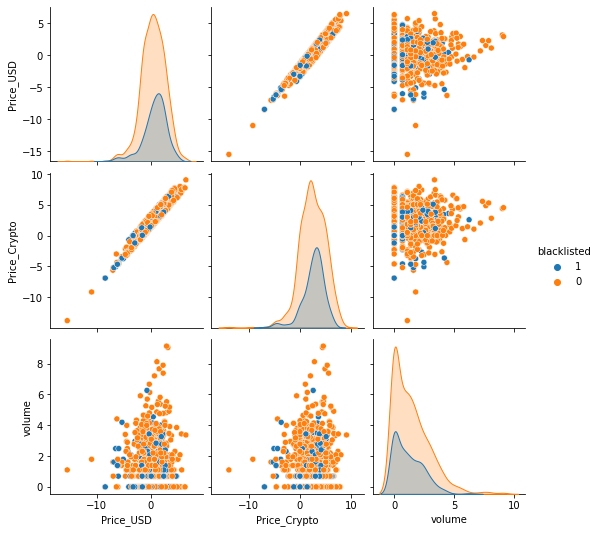

In [408]:
sns.pairplot(df1[['Price_USD', 'Price_Crypto','volume','blacklisted']], hue='blacklisted')

In [707]:
timeseries = []

day1_dataset_10min = None
for collection in collection_dfs:
    name = str(collection[0])
    collection_values = coll_train.loc[coll_train['collection']==name][['blacklist', 'whitelist']].values
    a_ts_collection = None
    if collection_values[0][0] == 1:
        a_ts_collection = convert_to_ts(collection[1], '10min')
        a_ts_collection['collection'] = name
        a_ts_collection['blacklisted'] = '1'
        a_ts_collection['whitelisted'] = '0'
    if collection_values[0][1] == 1:
        a_ts_collection = convert_to_ts(collection[1], '10min')
        a_ts_collection['collection'] = name
        a_ts_collection['blacklisted'] = '0'
        a_ts_collection['whitelisted'] = '1'
    
    # Only keep the first day (24 hours) of trades
    a_ts_collection = a_ts_collection.reset_index() # move 'Datetime_updated_seconds' from index to column
    a_ts_collection.columns = a_ts_collection.columns.str.replace('index', 'Datetime_updated_seconds')
    cutoff_date = a_ts_collection['Datetime_updated_seconds'].min() + timedelta(days=1)
    a_ts_collection = a_ts_collection[a_ts_collection['Datetime_updated_seconds'] < cutoff_date]

    # Rescale the data for each collection
    a_ts_collection['Price_USD_scl'] = a_ts_collection['Price_USD']/a_ts_collection['Price_USD'].max()
    a_ts_collection['Price_Crypto_scl'] = a_ts_collection['Price_Crypto']/a_ts_collection['Price_Crypto'].max()
    a_ts_collection['volume_scl'] = a_ts_collection['volume']/a_ts_collection['volume'].max()
    
    if a_ts_collection is not None:
        if day1_dataset_10min is not None:
            day1_dataset_10min = pd.concat([day1_dataset_10min, a_ts_collection])
        else:
            day1_dataset_10min = a_ts_collection

In [708]:
day1_dataset_10min

,Datetime_updated_seconds,Price_USD,Price_Crypto,volume,collection,blacklisted,whitelisted,Price_USD_scl,Price_Crypto_scl,volume_scl
0,2020-12-02 12:20:00,0.040150,1.0,1.0,12345rainbow,1,0,1.0,1.0,1.0
1,2020-12-02 12:30:00,0.040150,1.0,0.0,12345rainbow,1,0,1.0,1.0,0.0
2,2020-12-02 12:40:00,0.040150,1.0,0.0,12345rainbow,1,0,1.0,1.0,0.0
3,2020-12-02 12:50:00,0.040150,1.0,0.0,12345rainbow,1,0,1.0,1.0,0.0
4,2020-12-02 13:00:00,0.040150,1.0,0.0,12345rainbow,1,0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...
139,2020-10-12 21:20:00,0.720015,23.0,0.0,zombieartist,0,1,1.0,1.0,0.0
140,2020-10-12 21:30:00,0.720015,23.0,0.0,zombieartist,0,1,1.0,1.0,0.0
141,2020-10-12 21:40:00,0.720015,23.0,0.0,zombieartist,0,1,1.0,1.0,0.0
142,2020-10-12 21:50:00,0.720015,23.0,0.0,zombieartist,0,1,1.0,1.0,0.0


# TODO: Missing rows of data from convert_to_ts() ?

In [709]:
# Should be 144 (24*60/10) rows per collection, some are missing rows
day1_dataset_10min.shape[0]/len(day1_dataset_10min['collection'].unique())

144.0

In [430]:
import plotly.express as px

In [714]:
fig = px.line(day1_dataset_10min[day1_dataset_10min['blacklisted']=='1'], 
              x=day1_dataset_10min[day1_dataset_10min['blacklisted']=='1'].index, 
              y="volume", color='collection')
fig.show()

In [711]:
fig = px.line(day1_dataset_10min[(day1_dataset_10min['blacklisted']=='0')], 
              x=day1_dataset_10min[(day1_dataset_10min['blacklisted']=='0')].index, 
              y="USD", color='collection')
fig.show()

In [712]:
fig = px.line(day1_dataset_10min[(day1_dataset_10min['blacklisted']=='0') & (day1_dataset_10min['volume']<55)], 
              x=day1_dataset_10min[(day1_dataset_10min['blacklisted']=='0') & (day1_dataset_10min['volume']<55)].index, 
              y="volume", color='collection')
fig.show()